# Сравнение различных моделей кластеризации

Случай, когда оптимальное число кластеров для одних моделей зависит от оптимального числа кластеров для других.


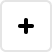
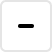
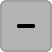
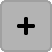
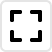
...
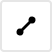
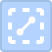
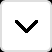
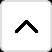
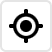

In [1]:
from itertools import product
from collections import namedtuple

import pandas as pd
from sklearn.metrics import mean_squared_error as error_metric

from lets_plot import *
from lets_plot.mapping import as_discrete
LetsPlot.setup_html()

import os; import sys; sys.path.append(os.path.join(sys.path[0], ".."))
from util import util as u
from util import clustering_model as ucm
from util import transform_data as utd

In [2]:
N_CLUSTERS_MIN, N_CLUSTERS_MAX = 3, 15

In [3]:
def calc_char_general_orders(df, *, name="general_order"):
    result_s = utd.calc_char_orders(df).loc["order"]
    result_s.name = name
    return result_s

def calc_char_mean_orders(df, *, font_cols=["font_family", "font_size", "font_face"], name="mean_order"):
    result_s = utd.calc_char_orders(df, font_cols=font_cols).mean()
    result_s.name = name
    return result_s

def prepare_extended_char_data(cw_df, full_cw_df, t_s):
    c_data = ucm.prepare_char_data(cw_df, t_s)
    general_order_s = calc_char_general_orders(full_cw_df)
    mean_order_s = calc_char_mean_orders(cw_df, font_cols=["font_family"])
    general_mean_order_s = calc_char_mean_orders(full_cw_df, name="general_mean_order")
    return pd.concat([c_data, general_order_s, mean_order_s, general_mean_order_s], axis="columns")

def get_min_scored_cluster(df, *, min_coeff=2.0/3.0, model_col="model", n_clusters_col="n_clusters", score_col="score"):
    def calc_min_scored_cluster(r):
        min_value = r.max()
        for v in r.values:
            if v < min_coeff * min_value:
                min_value = v
        return min_value
    replace_s = df.sort_values(by=n_clusters_col).groupby(model_col)[score_col].agg(calc_min_scored_cluster)
    return df.score == df[model_col].replace(replace_s)

In [4]:
ModelType = namedtuple("ModelType", ["name", "clustering_col", "calc_cluster_size_method", "admixture_col"])

clustering_cols = ["width", "order", "general_order", "mean_order", "general_mean_order"]
calc_cluster_size_methods = [
    ("non_weighted", lambda r: r.width.mean()),
    ("weighted", None),
]
admixture_cols = [
    ("non_admixtured", None),
    ("admixtured", "alphabet"),
]

model_types = [
    ModelType("clustered_by_{0}-{1}-{2}".format(t[0], t[1][0], t[2][0]), t[0], t[1][1], t[2][1])
    for t in product(clustering_cols, calc_cluster_size_methods, admixture_cols)
]
print("Model types:\n\t{0}".format("\n\t".join([model_type.name for model_type in model_types])))

Model types:
	clustered_by_width-non_weighted-non_admixtured
	clustered_by_width-non_weighted-admixtured
	clustered_by_width-weighted-non_admixtured
	clustered_by_width-weighted-admixtured
	clustered_by_order-non_weighted-non_admixtured
	clustered_by_order-non_weighted-admixtured
	clustered_by_order-weighted-non_admixtured
	clustered_by_order-weighted-admixtured
	clustered_by_general_order-non_weighted-non_admixtured
	clustered_by_general_order-non_weighted-admixtured
	clustered_by_general_order-weighted-non_admixtured
	clustered_by_general_order-weighted-admixtured
	clustered_by_mean_order-non_weighted-non_admixtured
	clustered_by_mean_order-non_weighted-admixtured
	clustered_by_mean_order-weighted-non_admixtured
	clustered_by_mean_order-weighted-admixtured
	clustered_by_general_mean_order-non_weighted-non_admixtured
	clustered_by_general_mean_order-non_weighted-admixtured
	clustered_by_general_mean_order-weighted-non_admixtured
	clustered_by_general_mean_order-weighted-admixtured


In [5]:
full_char_widths_df = u.read_data("../data/full/char_widths.csv", monospaced=False)
char_widths_df = utd.filter_by_font(full_char_widths_df, filters=["size", "face"])
print(char_widths_df.shape)
char_widths_df.head()

(5768, 5)


,char_id,char,alphabet,font_family,width
0,32,,latin,Geneva,5
1,33,!,latin,Geneva,6
2,34,"""",latin,Geneva,7
3,35,#,latin,Geneva,11
4,36,$,latin,Geneva,11


In [6]:
full_control_df = u.read_data("../data/full/control.csv", monospaced=False)
control_df = utd.filter_by_font(full_control_df, filters=["size", "face"])
control_df = utd.train_test_split_by_column(control_df, "text", train_frac=.1)[0]
train_control_df, test_control_df = utd.train_test_split_by_column(control_df, "text")
print("control_df.shape={0}".format(control_df.shape))
print("train_control_df.shape={0}".format(train_control_df.shape))
print("test_control_df.shape={0}".format(test_control_df.shape))
control_df.head()

control_df.shape=(3528, 5)
train_control_df.shape=(2653, 5)
test_control_df.shape=(875, 5)


,text,width,alphabet,font_family,symbols_count
0,Low,35,latin,Geneva,3.0
1,Bar,29,latin,Geneva,3.0
2,Job,32,latin,Geneva,3.0
3,None,45,latin,Geneva,4.0
4,Rise,39,latin,Geneva,4.0


In [7]:
full_texts_df = u.read_data("../data/full/texts.csv", monospaced=False)
texts_df = full_texts_df[["text", "alphabet"]].drop_duplicates()
print(texts_df.shape)
texts_df.head()

(2000, 2)


,text,alphabet
0,Dog,latin
1,Ago,latin
2,Move,latin
3,Blue,latin
4,Push,latin


In [8]:
char_df = pd.concat([
    prepare_extended_char_data(
        char_widths_df[char_widths_df.alphabet == alphabet],
        full_char_widths_df[full_char_widths_df.alphabet == alphabet],
        texts_df[texts_df.alphabet == alphabet].text
    ).assign(alphabet=lambda r: alphabet)
    for alphabet in char_widths_df.alphabet.unique()
])
print(char_df.shape)
char_df.head()

(824, 7)


,width,weight,order,general_order,mean_order,general_mean_order,alphabet
char,,,,,,,
,5.285714,36117,11,1,13.571429,6.000000,latin
!,6.142857,1,30,20,27.142857,17.779762,latin
"""",7.571429,1,64,69,75.142857,77.244048,latin
#,11.714286,1,224,216,215.285714,178.202381,latin
$,11.000000,1,196,171,179.000000,147.803571,latin


In [9]:
scores = []
for model_type in model_types:
        model = ucm.ClusteringModel(
            clustering_col=model_type.clustering_col,
            calc_cluster_size=model_type.calc_cluster_size_method,
            n_clusters=N_CLUSTERS_MIN, random_state=42
        ).fit(char_df, admixture_col=model_type.admixture_col)
        scores.append(error_metric(train_control_df.width, model.predict(train_control_df.text)))
target_score = min(scores)
target_score

269.98982284206556

In [10]:
target_score_coeff = 1.1
model_test_dfs = []
clusters_data = {"model": [], "best_n_clusters": []}
for model_type in model_types:
    model = None
    best_score = float("inf")
    best_n_clusters = N_CLUSTERS_MIN
    is_optimal_n_clusters = False
    for n_clusters in range(N_CLUSTERS_MIN, N_CLUSTERS_MAX + 1):
        model = ucm.ClusteringModel(
            clustering_col=model_type.clustering_col,
            calc_cluster_size=model_type.calc_cluster_size_method,
            n_clusters=n_clusters, random_state=42
        ).fit(char_df, admixture_col=model_type.admixture_col)
        score = error_metric(train_control_df.width, model.predict(train_control_df.text))
        if score < best_score:
            best_score = score
            best_n_clusters = n_clusters
        if score <= target_score_coeff * target_score:
            is_optimal_n_clusters = True
            break
    clusters_data["model"].append(model_type.name)
    clusters_data["best_n_clusters"].append(best_n_clusters)
    model = ucm.ClusteringModel(
        clustering_col=model_type.clustering_col,
        calc_cluster_size=model_type.calc_cluster_size_method,
        n_clusters=best_n_clusters, random_state=42
    ).fit(char_df, admixture_col=model_type.admixture_col)
    model_test_dfs.append(
        test_control_df.assign(
            model=model_type.name,
            predicted_width=model.predict(test_control_df.text),
        )
    )
    predictor = model.predictor
    print("\n\nModel {0}:".format(model_type.name))
    print("\tClusters number ({1}): {0}".format(
        len(predictor.cluster.unique()),
        "optimal" if is_optimal_n_clusters else "best possible"
    ))
    for cluster in predictor.cluster.sort_values().unique():
        print("\tCluster #{0}:".format(cluster))
        print("\t\tWidth: {0}".format(predictor[predictor.cluster == cluster].iloc[0].cluster_width))
        print("\t\tChars with positive weight: {0}".format(
            list(predictor[(predictor.cluster == cluster)&(predictor.weight > 1)].index)
        ))
test_df = pd.concat(model_test_dfs)
test_df["prediction_error"] = test_df.predicted_width - test_df.width
test_df["prediction_mean_error"] = test_df.prediction_error / test_df.symbols_count
print(test_df.shape)
test_df.head()



Model clustered_by_width-non_weighted-non_admixtured:
	Clusters number (optimal): 5
	Cluster #0:
		Width: 6.1375
		Chars with positive weight: [' ', 't', 'r', 'l', 'j', 'i', 'f', 'ï', 'î', 'Î', "'", 'I', 'г']
	Cluster #1:
		Width: 10.142857142857144
		Chars with positive weight: ['у', 'т', 'а', 'с', 'б', 'р', 'в', 'п', 'о', 'н', 'д', 'л', 'к', 'й', 'е', 'и', 'з', 'З', 'я', 'э', 'ь', 'ч', 'ц', 'х', 'Г', 'p', 'q', 's', 'u', 'v', 'x', 'y', 'z', 'o', 'n', 'k', 'h', 'J', 'L', 'a', 'c', 'd', 'e', 'g', 'b', 'à', 'û', 'â', 'ç', 'è', 'é', 'ê', 'ù', 'ô']
	Cluster #2:
		Width: 12.681401617250673
		Chars with positive weight: ['А', 'ъ', 'м', 'С', 'Р', 'П', 'Н', 'Л', 'К', 'Е', 'Д', 'В', 'Б', 'Т', 'У', 'Ч', 'Э', 'Х', 'U', 'V', 'Y', 'w', 'Ê', 'É', 'Â', 'T', 'C', 'B', 'A', 'E', 'F', 'S', 'R', 'P', 'H', 'K', 'N']
	Cluster #3:
		Width: 14.971563981042655
		Chars with positive weight: ['D', 'G', 'M', 'O', 'Q', 'm', 'ы', 'Ц', 'ж', 'ф', 'ш', 'щ', 'ю', 'Ф', 'И', 'М', 'О']
	Cluster #4:
		Width: 18.83643892



Model clustered_by_order-weighted-admixtured:
	Clusters number (optimal): 3
	Cluster #0-0:
		Width: 10.32962180027401
		Chars with positive weight: ['д', 'г', 'в', 'б', 'а', 'е', 'Ю', 'Ш', 'Ч', 'Э', 'ж', 'з', 'и', 'ч', 'ц', 'х', 'ф', 'у', 'т', 'с', 'р', 'п', 'о', 'н', 'м', 'л', 'к', 'й', 'Ц', 'Х', 'Ф', 'У', 'А', 'ш', 'Б', 'Г', 'Т', 'С', 'Р', 'П', 'О', 'Н', 'М', 'Л', 'К', 'И', 'З', 'Ж', 'Е', 'Д', 'В', 'щ', 'ы', 'я', 'ю', 'э', 'ь', 'ъ']
	Cluster #1-0:
		Width: 8.204439306279298
		Chars with positive weight: [' ', 'ô', 'ï', 'ê', 'é', 'è', 'ç', 'î', 'ù', 'û', 'â', 'n', 'l', 'k', 'j', 'i', 'h', 'g', 'o', 'f', 'd', 'c', 'b', 'a', 'e', 'p', 'r', 'q', 'z', 'y', 'x', 'v', 'u', 't', 's', "'", 'Y', 'T', 'L', 'J', 'I', 'F', 'P', 'Î', 'à']
	Cluster #1-1:
		Width: 15.584686835140888
		Chars with positive weight: ['Ê', 'É', 'B', 'A', 'C', 'Â', 'W', 'V', 'U', 'w', 'm', 'M', 'K', 'H', 'G', 'E', 'D', 'N', 'O', 'S', 'R', 'Q']


Model clustered_by_general_order-non_weighted-non_admixtured:
	Clusters num



Model clustered_by_mean_order-weighted-non_admixtured:
	Clusters number (best possible): 15
	Cluster #0:
		Width: 5.429580483758389
		Chars with positive weight: [' ', 'г', 'з', 'т', 'l', 'j', 'i', 't', "'"]
	Cluster #1:
		Width: 8.822350845948353
		Chars with positive weight: ['к', 'л', 'н', 'п', 'r', 'с', 'й', 'у', 'ч', 'ï', 'î', 'и', 'Î', 'э', 'Г', 'а', 'в', 'я', 'х', 'I', 'f']
	Cluster #10:
		Width: 13.613899613899614
		Chars with positive weight: ['R', 'C']
	Cluster #11:
		Width: 13.797786720321932
		Chars with positive weight: ['Ж', 'F']
	Cluster #12:
		Width: 14.444047619047618
		Chars with positive weight: ['Q', 'O', 'D', 'G']
	Cluster #13:
		Width: 16.13674437046705
		Chars with positive weight: ['m', 'M']
	Cluster #14:
		Width: 18.857142857142858
		Chars with positive weight: ['W']
	Cluster #2:
		Width: 9.40153483465838
		Chars with positive weight: ['ъ', 'К', 'J', 'z', 'y', 'x', 's', 'v', 'k']
	Cluster #3:
		Width: 10.175599910293785
		Chars with positive weight: ['â', 'a'

,text,width,alphabet,font_family,symbols_count,model,predicted_width,prediction_error,prediction_mean_error
0,Bar,29,latin,Geneva,3.0,clustered_by_width-non_weighted-non_admixtured,29,0,0.000000
1,Book,44,latin,Geneva,4.0,clustered_by_width-non_weighted-non_admixtured,43,-1,-0.250000
2,Trial,36,latin,Geneva,5.0,clustered_by_width-non_weighted-non_admixtured,41,5,1.000000
3,Garden,63,latin,Geneva,6.0,clustered_by_width-non_weighted-non_admixtured,62,-1,-0.166667
4,Best deal,80,latin,Geneva,9.0,clustered_by_width-non_weighted-non_admixtured,82,2,0.222222


In [11]:
ggplot(clusters_data) + \
    geom_bar(aes(as_discrete("model", order_by="best_n_clusters", order=1), "best_n_clusters"), stat='identity') + \
    ggsize(800, 800) + \
    ggtitle("Лучшее возможное число кластеров для каждой модели")

In [12]:
ggplot(test_df) + \
    geom_point(aes("width", "predicted_width", color="alphabet")) + \
    geom_abline(slope=1, color="black", size=1) + \
    facet_wrap(facets="model", ncol=2) + \
    scale_x_log10() + scale_y_log10() + \
    ggtitle("Отношение предсказанной ширины к реальной")

In [13]:
u.plot_matrix([
    ggplot(test_df[test_df.model == model]) + \
        geom_point(aes("symbols_count", "prediction_error", color="alphabet")) + \
        geom_smooth(aes("symbols_count", "prediction_error", color="alphabet")) + \
        geom_hline(yintercept=0, color="magenta") + \
        facet_wrap(facets="font_family", ncol=4) + \
        ggtitle("График абсолютной ошибки для {0}".format(model))
    for model in test_df.model.unique()
], width=800, height=400, columns=1)

In [14]:
u.plot_matrix([
    ggplot(test_df[test_df.model == model]) + \
        geom_density(aes(x="prediction_mean_error", color="alphabet"), size=2) + \
        geom_vline(xintercept=0, color="magenta") + \
        facet_wrap(facets="font_family", ncol=4) + \
        ggtitle("Плотность распределения средней ошибки для {0}".format(model))
    for model in test_df.model.unique()
], width=800, height=400, columns=1)